<a href="https://colab.research.google.com/github/AlyScripter/2025_pengolahan_citra_TI-2C/blob/main/Jobsheet_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Praktikum 1. Deteksi Tepi menggunakan operator sobel**

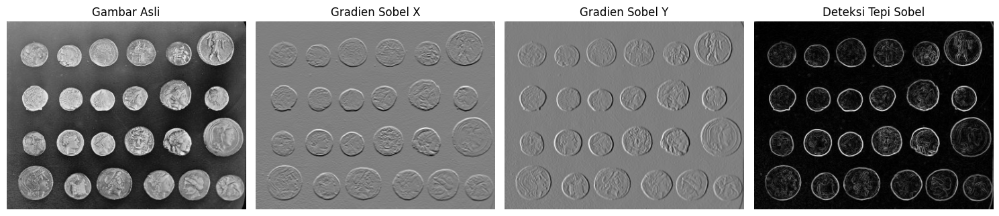

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

#ambil gambar bawaan dari skimage
image = data.coins()
gray_image = color.rgb2gray(image) if image.ndim == 3 else image #konversi ke grayscale jika perlu

#hitung gradien menggunakan operator sobel
sobel_x = filters.sobel_h(gray_image) # sobel diarah horizontal
sobel_y = filters.sobel_v(gray_image) # sobel diarah vertikal
sobel_edge = filters.sobel(gray_image) #sobel gabungan

#visualisasi hasil
fig, axes = plt.subplots(1, 4, figsize=(15, 5))
ax = axes.ravel()

ax[0].imshow(image, cmap='gray')
ax[0].set_title('Gambar Asli')
ax[0].axis('off')

ax[1].imshow(sobel_x, cmap='gray')
ax[1].set_title('Gradien Sobel X')
ax[1].axis('off')

ax[2].imshow(sobel_y, cmap='gray')
ax[2].set_title('Gradien Sobel Y')
ax[2].axis('off')

ax[3].imshow(sobel_edge, cmap='gray')
ax[3].set_title('Deteksi Tepi Sobel')
ax[3].axis('off')

plt.tight_layout()
plt.show()



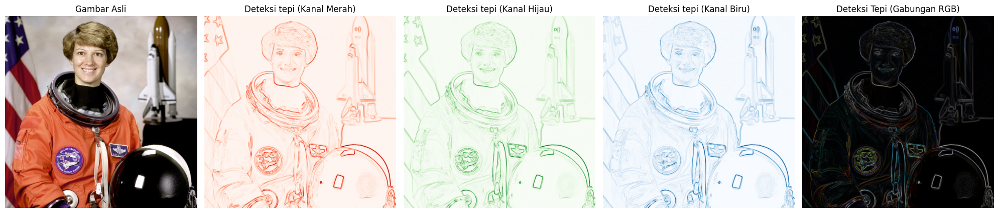

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

#ambil gambar bawaan dari skimage
image = data.astronaut() #gambar berwarna bawaan dari skimage

#pisahkan kanal warna
red_channel = image[:, :, 0] # kanal merah
green_channel = image[:, :, 1] #kanal hijau
blue_channel = image[:, :, 2] # kanal biru

#terapkan operator sobel pada masing masing kanal warna
sobel_red = filters.sobel(red_channel)
sobel_green = filters.sobel(green_channel)
sobel_blue = filters.sobel(blue_channel)

#gabungkan hasil dengan mengambil rata rata dari ketiga kanal
sobel_color = np.stack([sobel_red, sobel_green, sobel_blue], axis=2)

# visualisasi hasil
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
ax = axes.ravel()

ax[0].imshow(image)
ax[0].set_title('Gambar Asli')
ax[0].axis('off')

ax[1].imshow(sobel_red, cmap='Reds')
ax[1].set_title('Deteksi tepi (Kanal Merah)')
ax[1].axis('off')

ax[2].imshow(sobel_green, cmap='Greens')
ax[2].set_title('Deteksi tepi (Kanal Hijau)')
ax[2].axis('off')

ax[3].imshow(sobel_blue, cmap='Blues')
ax[3].set_title('Deteksi tepi (Kanal Biru)')
ax[3].axis('off')

ax[4].imshow(sobel_color)
ax[4].set_title('Deteksi Tepi (Gabungan RGB)')
ax[4].axis('off')

plt.tight_layout()
plt.show()

**Praktikum 2. Deteksi Tepi dengan operator Roberts**

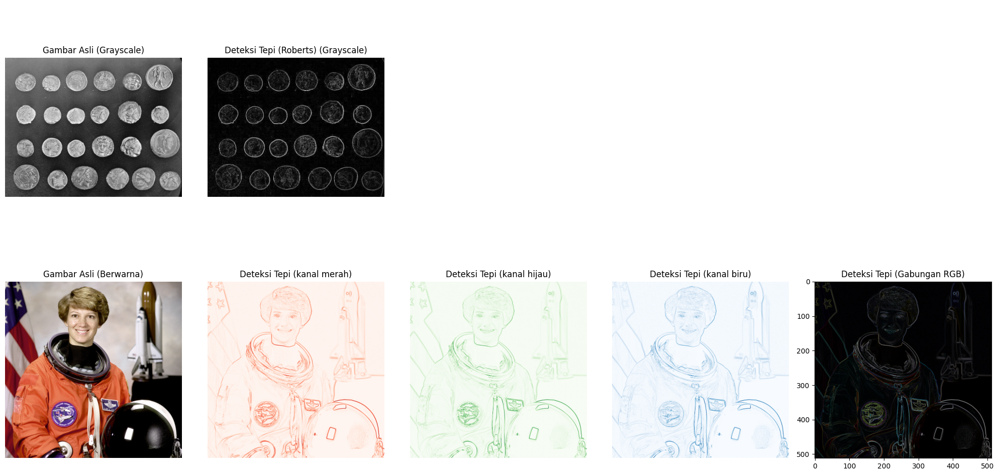

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

# deteksi tepi roberts pada citra grayscale

#ambil gambar grayscale dari skimage
image_gray = data.coins()

#terapkan operator roberts
roberts_gray = filters.roberts(image_gray)

#deteksi tepi roberts pada citra berwarna

# ambil gambar berwarna dari skimage
image_color = data.astronaut()

#pisahkan red, green, blue (R, G, B)
red_channel = image_color[:, :, 0] # kanal merah
green_channel = image_color[:, :, 1] # kanal hijau
blue_channel = image_color[:, :, 2] # kanal biru

#terapkan operator roberts pada masing masing kanal warna
roberts_red = filters.roberts(red_channel)
roberts_green = filters.roberts(green_channel)
roberts_blue = filters.roberts(blue_channel)

#gabungkan hasil deteksi dari tepi ketiga kanal
roberts_color = np.stack([roberts_red, roberts_green, roberts_blue], axis=2)

#visualisasi hasil
fig, axes = plt.subplots(2, 5, figsize=(20, 10))
ax = axes.ravel()

# baris 1: Citra Grayscale
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title('Gambar Asli (Grayscale)')
ax[0].axis('off')

ax[1].imshow(roberts_gray, cmap='gray')
ax[1].set_title('Deteksi Tepi (Roberts) (Grayscale)')
ax[1].axis('off')

#kosongkan posisi 3, 4, dan 5 agar baris pertama rapi
for i in range(2, 5):
    ax[i].axis('off')

# baris 2: Citra Berwarna
ax[5].imshow(image_color)
ax[5].set_title('Gambar Asli (Berwarna)')
ax[5].axis('off')

ax[6].imshow(roberts_red, cmap='Reds')
ax[6].set_title('Deteksi Tepi (kanal merah)')
ax[6].axis('off')

ax[7].imshow(roberts_green, cmap='Greens')
ax[7].set_title('Deteksi Tepi (kanal hijau)')
ax[7].axis('off')

ax[8].imshow(roberts_blue, cmap='Blues')
ax[8].set_title('Deteksi Tepi (kanal biru)')
ax[8].axis('off')

ax[9].imshow(roberts_color)
ax[9].set_title('Deteksi Tepi (Gabungan RGB)')

plt.tight_layout()
plt.show()

**Praktikum 3. Perbandingan deteksi tepi dengan beberapa operator (Sobel, Roberts,
Prewitt, Kirsch, dan Canny) pada citra grayscale**

<function matplotlib.pyplot.show(close=None, block=None)>

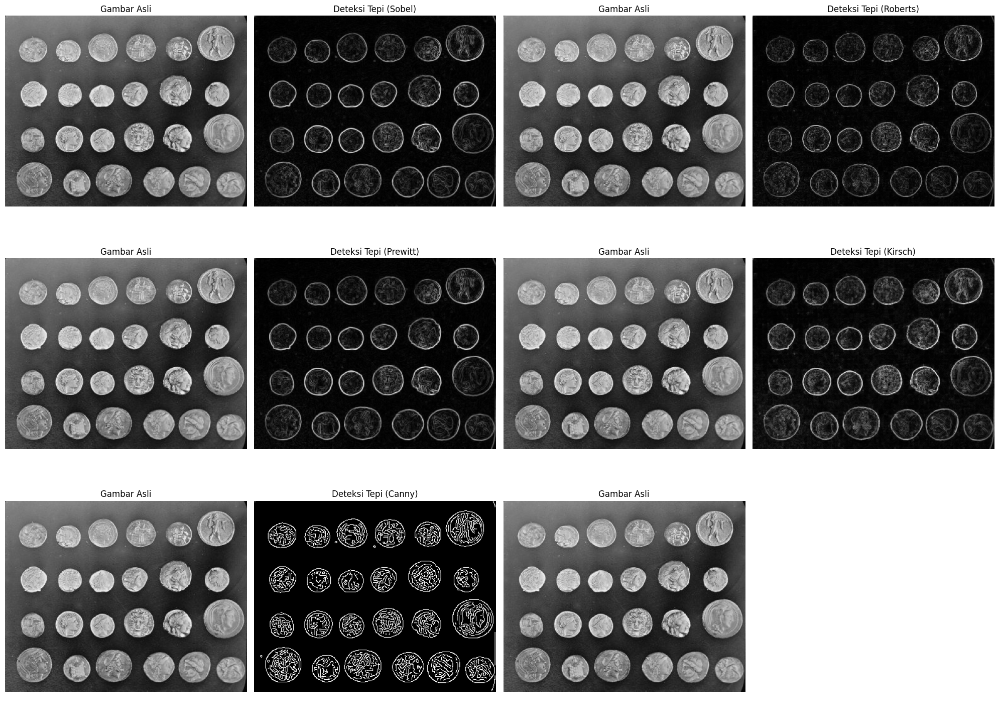

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters, feature
from skimage.filters.rank import gradient
from skimage.morphology import disk

# ambil gambar koin dari skimage
image_gray = data.coins() # gambar grayscale

#terapkan berbagai operator deteksi tepi

#operator sobel
sobel_edge = filters.sobel(image_gray)

#operator roberts
roberts_edge = filters.roberts(image_gray)

#operator prewitt
prewitt_edge = filters.prewitt(image_gray)

#operator kirsch (Menggunakan filter gradien berbasis morfologi)
kirsch_edge = gradient(image_gray, disk(1))

#operator canny
canny_edge = feature.canny(image_gray, sigma=1)

#visualisasi hasil (format 4 kolom, 3 baris)
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
ax = axes.ravel()

# baris 1: Gambar Asli - sobel
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title('Gambar Asli')
ax[0].axis('off')

ax[1].imshow(sobel_edge, cmap='gray')
ax[1].set_title('Deteksi Tepi (Sobel)')
ax[1].axis('off')

ax[2].imshow(image_gray, cmap='gray')
ax[2].set_title('Gambar Asli')
ax[2].axis('off')

ax[3].imshow(roberts_edge, cmap='gray')
ax[3].set_title('Deteksi Tepi (Roberts)')
ax[3].axis('off')

# baris 2: gambar asli - prewitt
ax[4].imshow(image_gray, cmap='gray')
ax[4].set_title('Gambar Asli')
ax[4].axis('off')

ax[5].imshow(prewitt_edge, cmap='gray')
ax[5].set_title('Deteksi Tepi (Prewitt)')
ax[5].axis('off')

ax[6].imshow(image_gray, cmap='gray')
ax[6].set_title('Gambar Asli')
ax[6].axis('off')

ax[7].imshow(kirsch_edge, cmap='gray')
ax[7].set_title('Deteksi Tepi (Kirsch)')
ax[7].axis('off')

# baris 3: gambar asli - canny
ax[8].imshow(image_gray, cmap='gray')
ax[8].set_title('Gambar Asli')
ax[8].axis('off')

ax[9].imshow(canny_edge, cmap='gray')
ax[9].set_title('Deteksi Tepi (Canny)')
ax[9].axis('off')

ax[10].imshow(image_gray, cmap='gray')
ax[10].set_title('Gambar Asli')
ax[10].axis('off')

# kosongkan posisi terakhir agar tampilan rapi
ax[11].axis('off')

# tampilkan plot
plt.tight_layout()
plt.show

**Praktikum 4. Perbandingan deteksi tepi dengan beberapa operator (Sobel, Roberts,
Prewitt, Kirsch, dan Canny) pada citra**

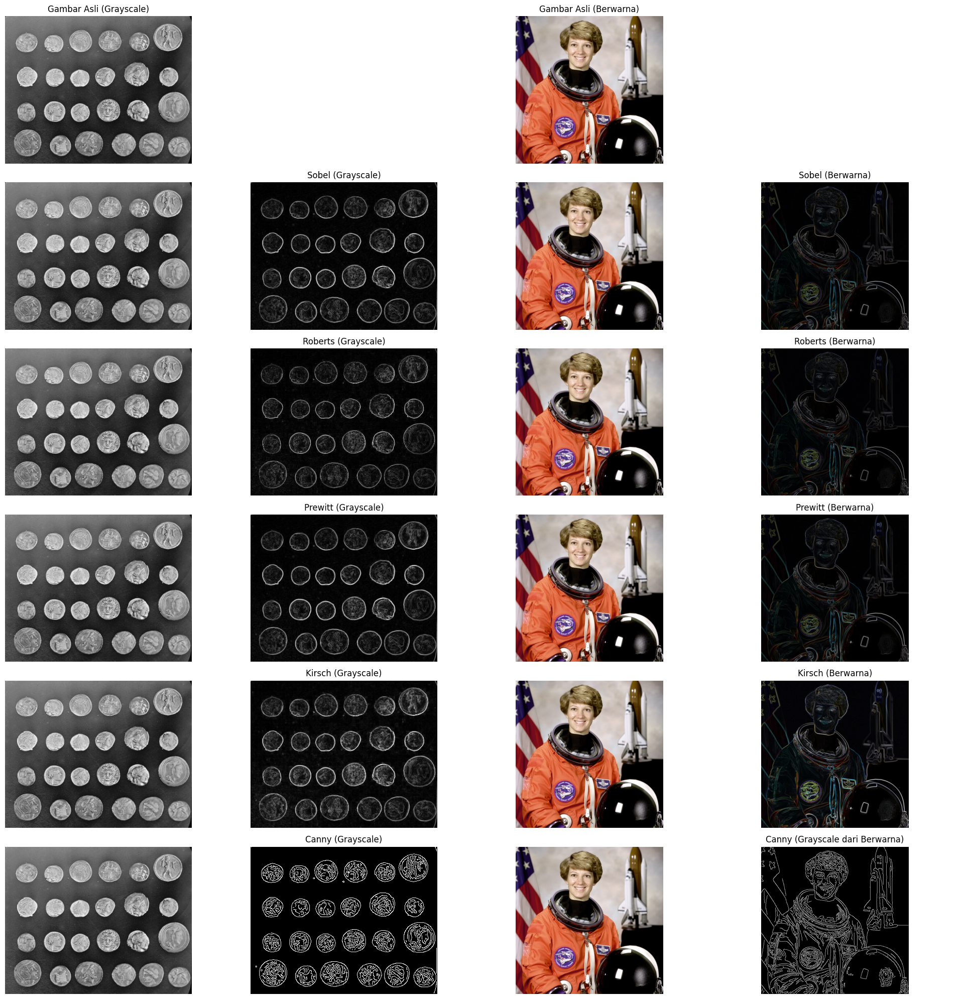

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters, feature, color
from skimage.filters.rank import gradient
from skimage.morphology import disk

# 1. Ambil Gambar Grayscale & Berwarna
image_gray = data.coins()         # Gambar grayscale
image_color = data.astronaut()    # Gambar berwarna

# 2. Terapkan Operator Deteksi Tepi
# Pada Gambar Grayscale
sobel_gray = filters.sobel(image_gray)
roberts_gray = filters.roberts(image_gray)
prewitt_gray = filters.prewitt(image_gray)
kirsch_gray = gradient(image_gray, disk(1))
canny_gray = feature.canny(image_gray, sigma=1)

# Pada Gambar Berwarna (Per Kanal RGB)
def apply_edge_detection(image, operator):
    # Menerapkan operator deteksi tepi pada setiap kanal warna (R, G, B).
    red = operator(image[:, :, 0])
    green = operator(image[:, :, 1])
    blue = operator(image[:, :, 2])
    return np.stack((red, green, blue), axis=2)

sobel_color = apply_edge_detection(image_color, filters.sobel)
roberts_color = apply_edge_detection(image_color, filters.roberts)
prewitt_color = apply_edge_detection(image_color, filters.prewitt)
kirsch_color = apply_edge_detection(image_color, lambda img: gradient(img, disk(1)))
canny_color = feature.canny(color.rgb2gray(image_color), sigma=1)  # Canny hanya untuk grayscale

# 3. Visualisasi Hasil
fig, axes = plt.subplots(6, 4, figsize=(20, 20))
ax = axes.ravel()

# Baris 1: Gambar Asli
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title("Gambar Asli (Grayscale)")
ax[1].axis("off")
ax[2].imshow(image_color)
ax[2].set_title("Gambar Asli (Berwarna)")
ax[3].axis("off")

# Baris 2: Sobel
ax[4].imshow(image_gray, cmap='gray')
ax[5].imshow(sobel_gray, cmap='gray')
ax[5].set_title("Sobel (Grayscale)")
ax[6].imshow(image_color)
ax[7].imshow(sobel_color)
ax[7].set_title("Sobel (Berwarna)")

# Baris 3: Roberts
ax[8].imshow(image_gray, cmap='gray')
ax[9].imshow(roberts_gray, cmap='gray')
ax[9].set_title("Roberts (Grayscale)")
ax[10].imshow(image_color)
ax[11].imshow(roberts_color)
ax[11].set_title("Roberts (Berwarna)")

# Baris 4: Prewitt
ax[12].imshow(image_gray, cmap='gray')
ax[13].imshow(prewitt_gray, cmap='gray')
ax[13].set_title("Prewitt (Grayscale)")
ax[14].imshow(image_color)
ax[15].imshow(prewitt_color)
ax[15].set_title("Prewitt (Berwarna)")

# Baris 5: Kirsch
ax[16].imshow(image_gray, cmap='gray')
ax[17].imshow(kirsch_gray, cmap='gray')
ax[17].set_title("Kirsch (Grayscale)")
ax[18].imshow(image_color)
ax[19].imshow(kirsch_color)
ax[19].set_title("Kirsch (Berwarna)")

# Baris 6: Canny
ax[20].imshow(image_gray, cmap='gray')
ax[21].imshow(canny_gray, cmap='gray')
ax[21].set_title("Canny (Grayscale)")
ax[22].imshow(image_color)
ax[23].imshow(canny_color, cmap='gray')
ax[23].set_title("Canny (Grayscale dari Berwarna)")

for a in ax:
    a.axis("off")

plt.tight_layout()
plt.show()


**TUGAS - Program untuk melakukan perbandingan deteksi tepi dari beberapa operator dengan gambar pribadi**

Downloading...
From: https://drive.google.com/uc?id=1xDTQ9-rFKRIt1TAwZXtt0Txkz6npTZbH
To: /content/image_gray.jpg
100%|██████████| 32.0k/32.0k [00:00<00:00, 38.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1NSbxwG1PcyhJqYOGcbSUFNOsa7G9ltf0
To: /content/image_color.jpg
100%|██████████| 92.9k/92.9k [00:00<00:00, 62.0MB/s]


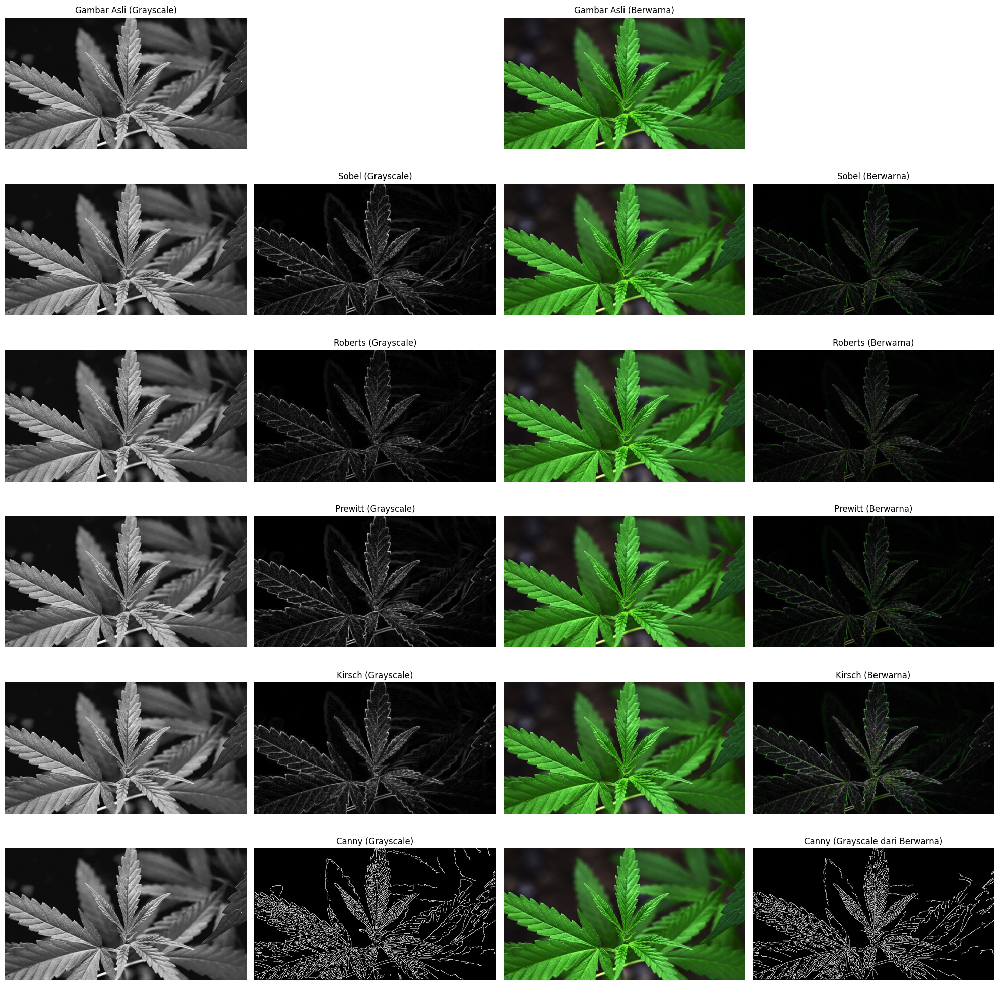

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import filters, feature, color
from skimage.filters.rank import gradient
from skimage.morphology import disk
from PIL import Image
import gdown

# Unduh gambar dari Google Drive
grayscale_url = 'https://drive.google.com/uc?id=1xDTQ9-rFKRIt1TAwZXtt0Txkz6npTZbH'
color_url = 'https://drive.google.com/uc?id=1NSbxwG1PcyhJqYOGcbSUFNOsa7G9ltf0'
gdown.download(grayscale_url, 'image_gray.jpg', quiet=False)
gdown.download(color_url, 'image_color.jpg', quiet=False)

# Baca gambar grayscale dan berwarna
image_gray = np.array(Image.open('image_gray.jpg').convert('L'))
image_color = np.array(Image.open('image_color.jpg'))

# Terapkan Operator Deteksi Tepi - Grayscale
sobel_gray = filters.sobel(image_gray)
roberts_gray = filters.roberts(image_gray)
prewitt_gray = filters.prewitt(image_gray)
kirsch_gray = gradient(image_gray, disk(1))
canny_gray = feature.canny(image_gray, sigma=1)

# Fungsi deteksi tepi pada gambar berwarna (per kanal RGB)
def apply_edge_detection(image, operator):
    red = operator(image[:, :, 0])
    green = operator(image[:, :, 1])
    blue = operator(image[:, :, 2])
    return np.stack((red, green, blue), axis=2)

sobel_color = apply_edge_detection(image_color, filters.sobel)
roberts_color = apply_edge_detection(image_color, filters.roberts)
prewitt_color = apply_edge_detection(image_color, filters.prewitt)
kirsch_color = apply_edge_detection(image_color, lambda img: gradient(img, disk(1)))
canny_color = feature.canny(color.rgb2gray(image_color), sigma=1)

# Visualisasi Hasil
fig, axes = plt.subplots(6, 4, figsize=(20, 20))
ax = axes.ravel()

# Baris 1: Gambar Asli
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title('Gambar Asli (Grayscale)')
ax[1].axis('off')
ax[2].imshow(image_color)
ax[2].set_title('Gambar Asli (Berwarna)')
ax[3].axis('off')

# Baris 2: Sobel
ax[4].imshow(image_gray, cmap='gray')
ax[5].imshow(sobel_gray, cmap='gray')
ax[5].set_title('Sobel (Grayscale)')
ax[6].imshow(image_color)
ax[7].imshow(sobel_color)
ax[7].set_title('Sobel (Berwarna)')

# Baris 3: Roberts
ax[8].imshow(image_gray, cmap='gray')
ax[9].imshow(roberts_gray, cmap='gray')
ax[9].set_title('Roberts (Grayscale)')
ax[10].imshow(image_color)
ax[11].imshow(roberts_color)
ax[11].set_title('Roberts (Berwarna)')

# Baris 4: Prewitt
ax[12].imshow(image_gray, cmap='gray')
ax[13].imshow(prewitt_gray, cmap='gray')
ax[13].set_title('Prewitt (Grayscale)')
ax[14].imshow(image_color)
ax[15].imshow(prewitt_color)
ax[15].set_title('Prewitt (Berwarna)')

# Baris 5: Kirsch
ax[16].imshow(image_gray, cmap='gray')
ax[17].imshow(kirsch_gray, cmap='gray')
ax[17].set_title('Kirsch (Grayscale)')
ax[18].imshow(image_color)
ax[19].imshow(kirsch_color)
ax[19].set_title('Kirsch (Berwarna)')

# Baris 6: Canny
ax[20].imshow(image_gray, cmap='gray')
ax[21].imshow(canny_gray, cmap='gray')
ax[21].set_title('Canny (Grayscale)')
ax[22].imshow(image_color)
ax[23].imshow(canny_color, cmap='gray')
ax[23].set_title('Canny (Grayscale dari Berwarna)')

for a in ax:
    a.axis('off')

plt.tight_layout()
plt.show()
